In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import scipy.cluster.hierarchy as shc

In [2]:
input_path = '/Volumes/Behaviour/Tailored 3sec 2P Trials' 
output_path = '/Volumes/Behaviour/Tailored 3sec 2P Trials/Trial Mean Correlation Matrices'
pearsons = pd.read_csv('/Volumes/Behaviour 3/Bodyvectors_07_2000/pearsons_long_07_2000.csv', index_col=0)
sessions = [session for session in os.listdir(input_path) if session.endswith('.csv')]
stimuli = ['warm', 'hot', 'opto', 'off-target', 'von frey', 'pin-prick', 'approach', 'no stim']

processing:  dF_F0_SHORT_2P06_Ses01.csv
2P06_Ses01
processing:  dF_F0_SHORT_2P06_Ses02.csv
2P06_Ses02
processing:  dF_F0_SHORT_2P06_Ses03.csv
2P06_Ses03
processing:  dF_F0_SHORT_2P05_Ses04.csv
2P05_Ses04
processing:  dF_F0_SHORT_2P06_Ses04.csv
2P06_Ses04
processing:  dF_F0_SHORT_2P06_Ses05.csv
2P06_Ses05
processing:  dF_F0_SHORT_2P05_Ses06.csv
2P05_Ses06
processing:  dF_F0_SHORT_2P06_Ses06.csv
2P06_Ses06
processing:  dF_F0_SHORT_2P05_Ses07.csv
2P05_Ses07
processing:  dF_F0_SHORT_2P06_Ses07.csv
2P06_Ses07
processing:  dF_F0_SHORT_2P07_Ses01.csv
2P07_Ses01
processing:  dF_F0_SHORT_2P08_Ses01.csv
2P08_Ses01
processing:  dF_F0_SHORT_2P07_Ses03.csv
2P07_Ses03
processing:  dF_F0_SHORT_2P08_Ses02.csv
2P08_Ses02
processing:  dF_F0_SHORT_2P07_Ses04.csv
2P07_Ses04
processing:  dF_F0_SHORT_2P07_Ses05.csv
2P07_Ses05
processing:  dF_F0_SHORT_2P08_Ses04.csv
2P08_Ses04
processing:  dF_F0_SHORT_2P07_Ses06.csv
2P07_Ses06
processing:  dF_F0_SHORT_2P08_Ses05.csv
2P08_Ses05
processing:  dF_F0_SHORT_2P07_S

/Users/aspra/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


processing:  dF_F0_SHORT_2P09_Ses01.csv
2P09_Ses01
processing:  dF_F0_SHORT_2P11_Ses01.csv
2P11_Ses01
processing:  dF_F0_SHORT_2P10_Ses01.csv
2P10_Ses01
processing:  dF_F0_SHORT_2P09_Ses02.csv
2P09_Ses02
processing:  dF_F0_SHORT_2P10_Ses02.csv
2P10_Ses02
processing:  dF_F0_SHORT_2P09_Ses04.csv
2P09_Ses04
processing:  dF_F0_SHORT_2P11_Ses04.csv
2P11_Ses04
processing:  dF_F0_SHORT_2P11_Ses05.csv
2P11_Ses05
processing:  dF_F0_SHORT_2P11_Ses02.csv
2P11_Ses02
processing:  dF_F0_SHORT_2P09_Ses03.csv
2P09_Ses03
processing:  dF_F0_SHORT_2P10_Ses03.csv
2P10_Ses03
processing:  dF_F0_SHORT_2P10_Ses04.csv
2P10_Ses04
processing:  dF_F0_SHORT_2P09_Ses05.csv
2P09_Ses05
processing:  dF_F0_SHORT_2P10_Ses05.csv
2P10_Ses05
processing:  dF_F0_SHORT_2P11_Ses06.csv
2P11_Ses06
processing:  dF_F0_SHORT_2P05_Ses03.csv
2P05_Ses03


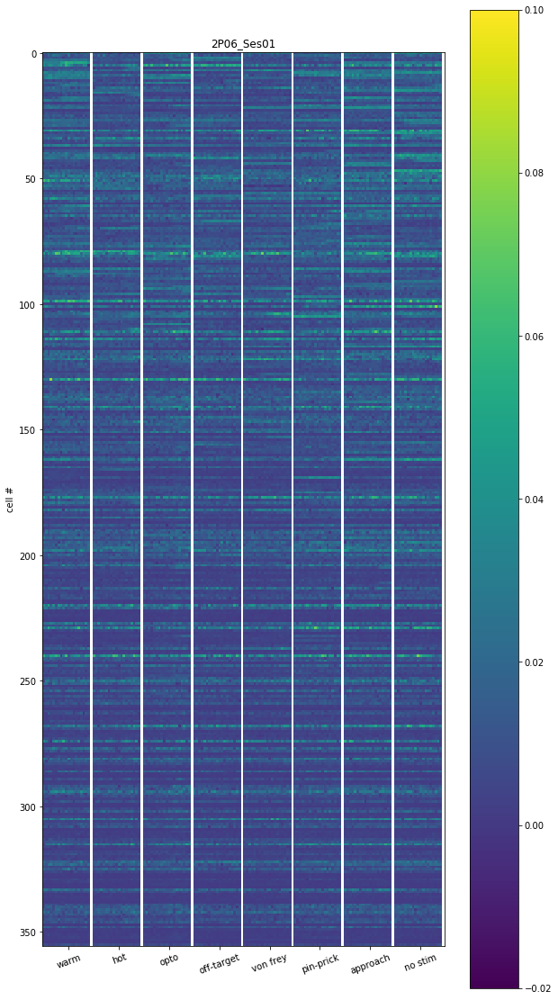

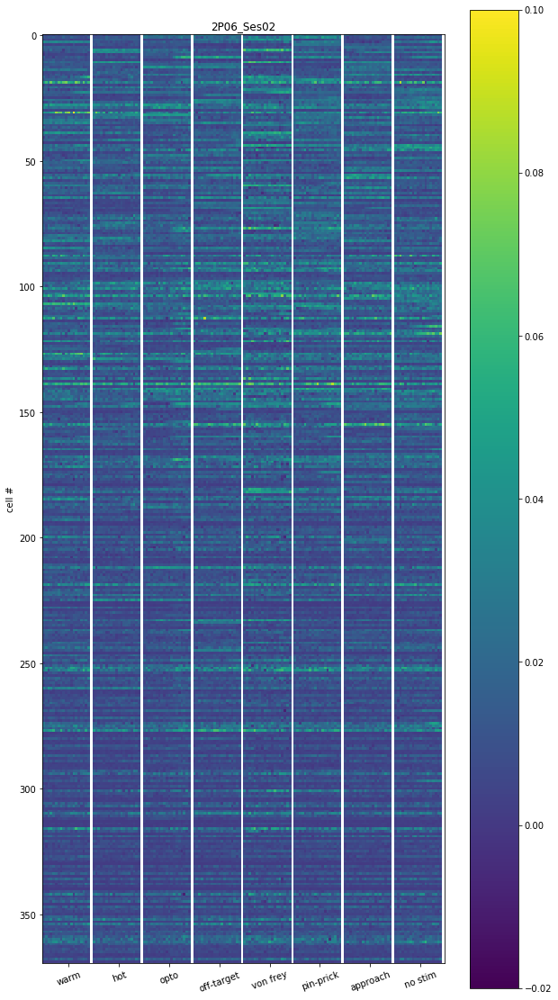

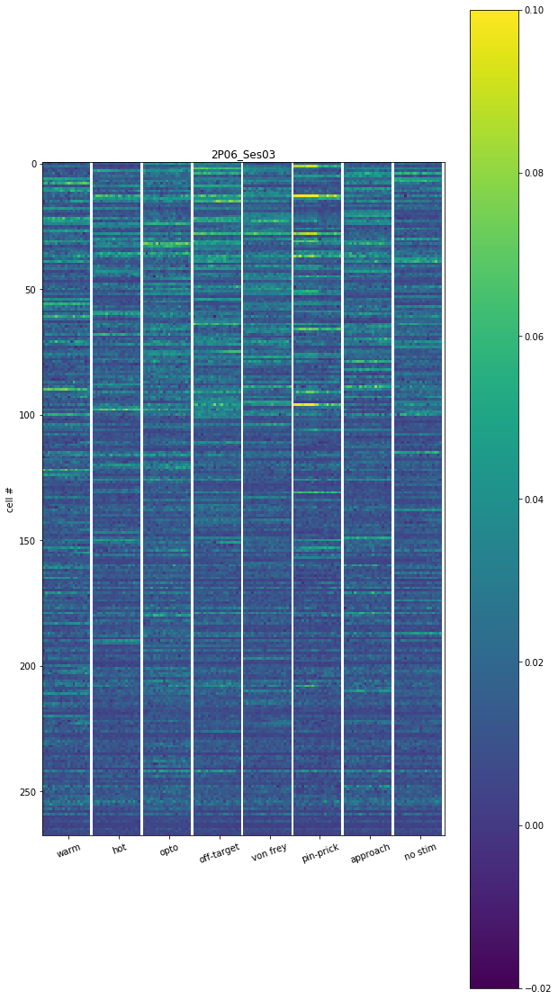

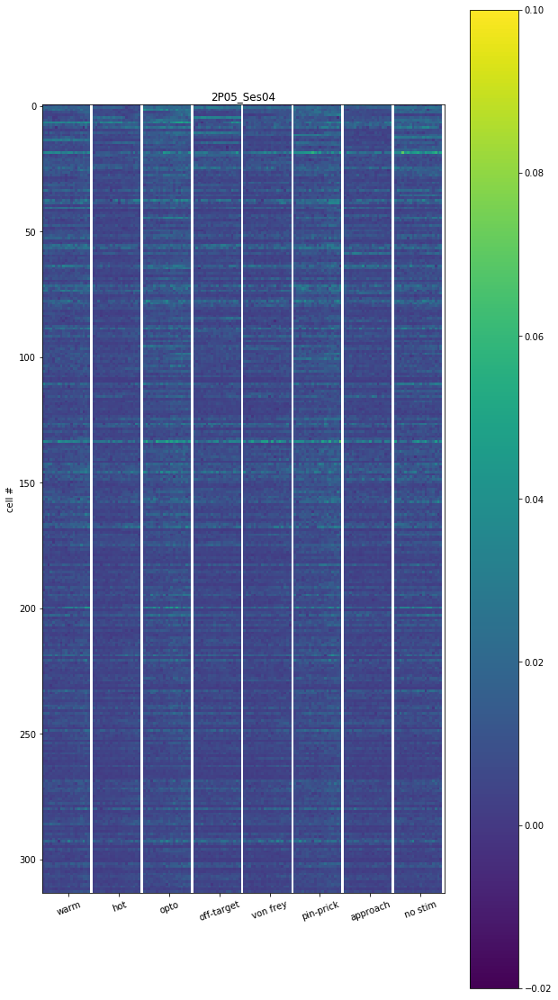

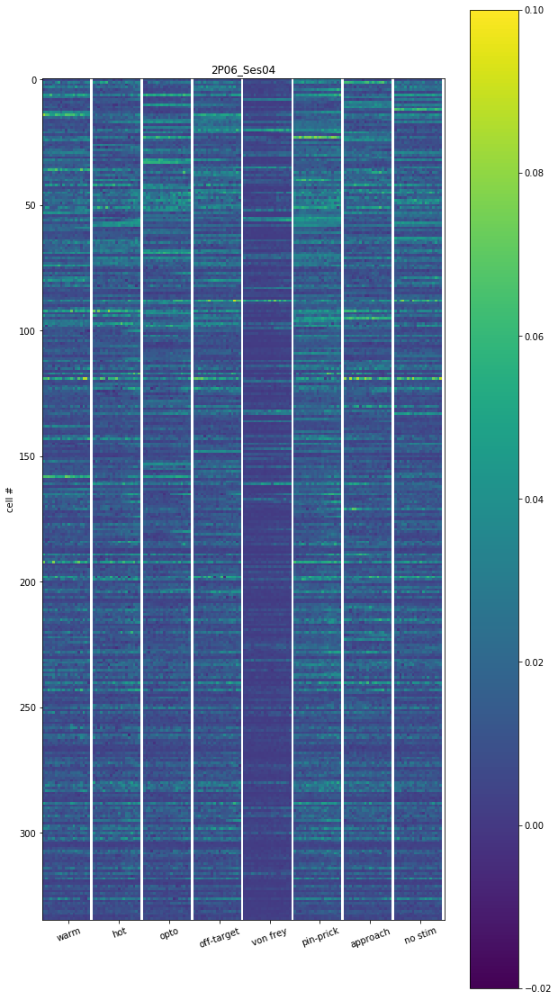

...

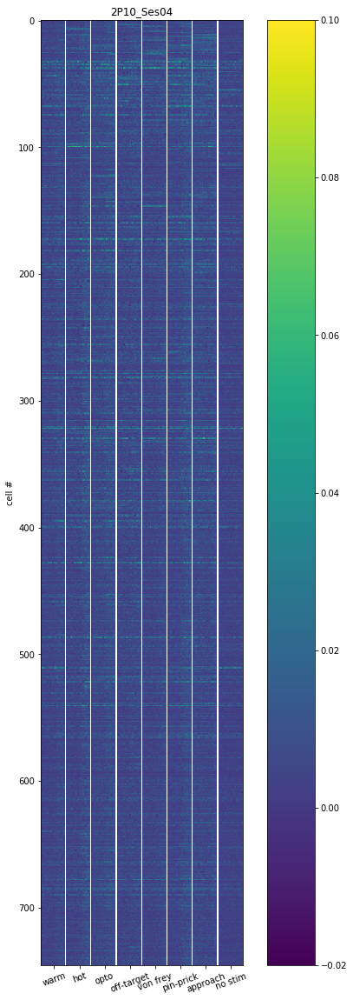

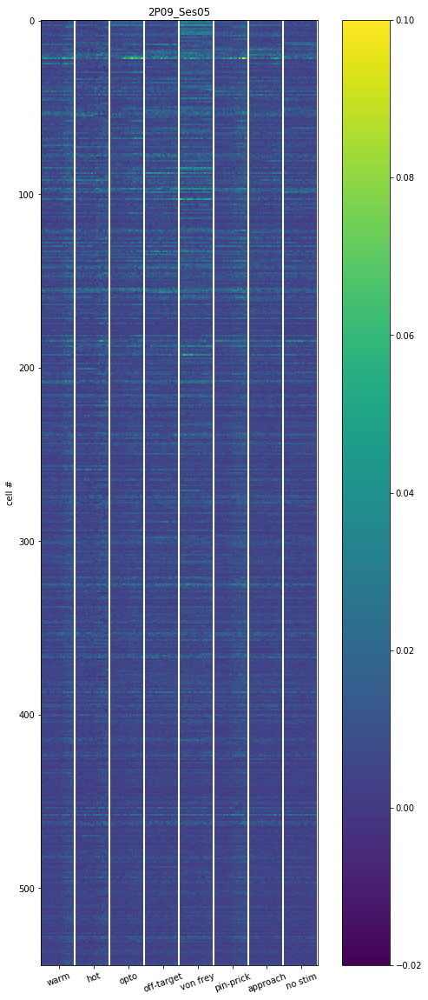

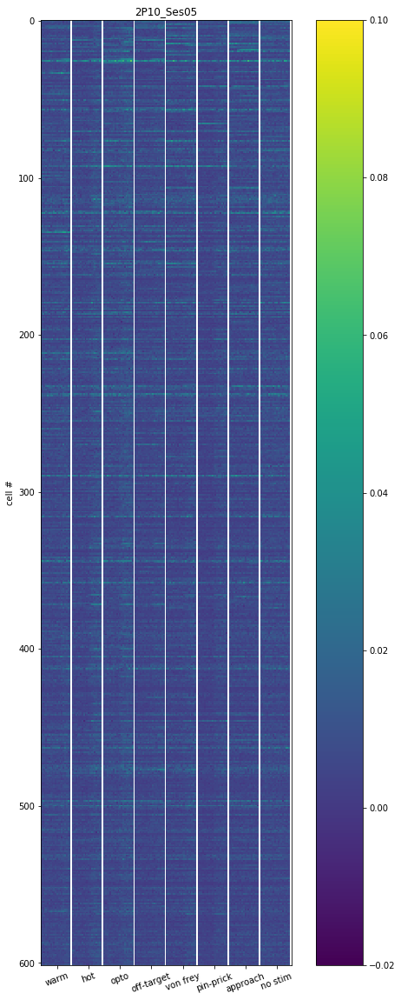

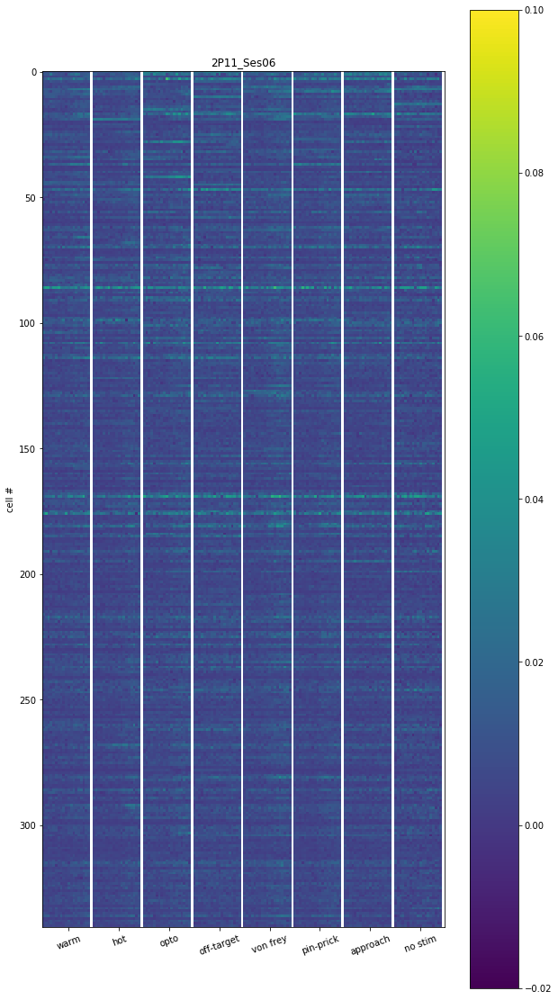

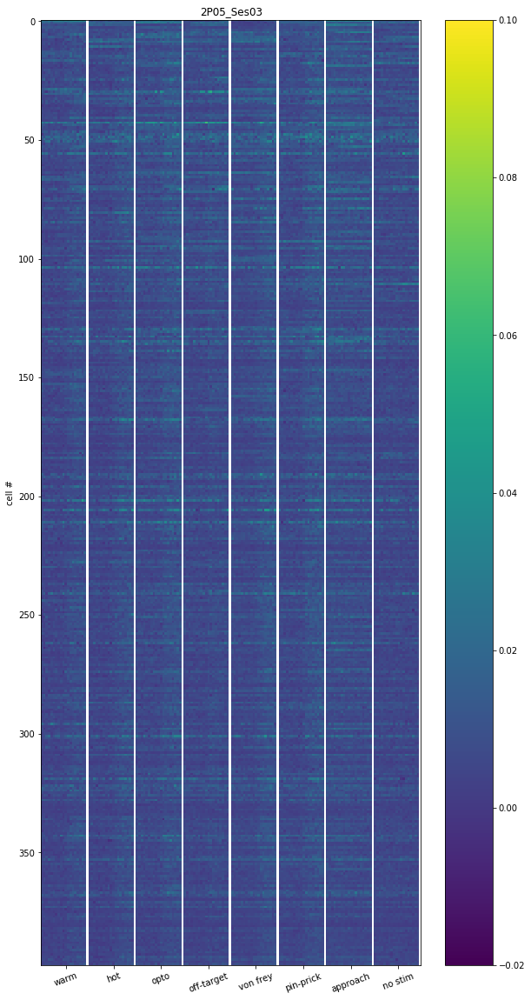

In [7]:
# Compiling trial averages and maximafor hier
for session in sessions:
    if session.startswith('._'): # circumventing issues with invisible files on external drives
        continue
    if session.endswith('2P05_Ses01.csv'): # excluding for the time being incomplete sessions (half-sessions)
        continue
    if session.endswith('2P05_Ses02.csv'):
        continue
    if session.endswith('2P07_Ses02.csv'):
        continue
    if session.endswith('2P11_Ses03.csv'):
        continue
    if session.endswith('2P08_Ses03.csv'): # this one doesn't have 'opto' or 'approach'
        continue
    if session.endswith('CFA.csv'): # excluding for the time being CFA sessions
        continue
    
    print('processing: ', session)
    
    session_name = session[12:22]
    print(session_name)
    
    session_pearsons = pearsons[pearsons['cell_id'].str.contains(str(session_name))]
    motion = session_pearsons[session_pearsons['pearsons'] >= 0.20]
    motion_ids = list(motion['cell_id'])
    
    cells = pd.read_csv(os.path.join(input_path,session), index_col=0)
    still_cells = cells.drop(columns=motion_ids)
    still_ids = list(still_cells.columns)
    
    mean_matrix = pd.DataFrame()
    max_matrix = pd.DataFrame()
    
    for s in stimuli:
        cols = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19]
        trial_means = []
        trial_maxis = []
        stimulation = still_cells[still_cells['identifier'].str.contains(str((s)))]
        stimulation = stimulation.reset_index(drop=True)
        trials = stimulation['identifier'].unique()
        
        for sid in still_ids[:-1]:
            repli_traces = pd.DataFrame()
            
            for t in trials:
                trace_idx = stimulation[stimulation['identifier'].str.contains(str(t))].index.tolist()
                trace = stimulation[sid]
                temp_trace = trace.loc[trace_idx[0]:trace_idx[-1]]
                temp_trace = temp_trace.reset_index(drop=True)
                repli_traces[t] = temp_trace
                #smooth_trace = temp_trace.rolling(2, center=True).mean()
                #plt.plot(smooth_trace, alpha=0.5)
                #plt.axvline(x=10, color='red', lw=1)
                #plt.ylim([-0.02,0.1])
                #plt.title(s+'_'+sid)
            #plt.plot(repli_traces.mean(axis=1), color='black', alpha=0.5)
            #plt.show()
            
            trial_means.append(repli_traces.mean(axis=1))
            trial_maxis.append(repli_traces.max(axis=0).mean())
            
        df = pd.DataFrame(trial_means, columns=cols)
        #df['cell'] = still_ids[:-1]
        #df['stimulus'] = s
        mean_matrix = pd.concat([mean_matrix, df], axis=1)
        
        df1 = pd.DataFrame(trial_maxis)
        df1['cell'] = still_ids[:-1]
        df1['stimulus'] = s
        max_matrix = pd.concat([max_matrix, df1], axis=0)
        

    #mean_matrix['cell'] = mean_matrix['cell']+'_'+mean_matrix['stimulus']
    #mean_matrix = mean_matrix.drop(columns='stimulus')   
    #mean_matrix = mean_matrix.set_index('cell') 
    #mean_matrix.to_csv(os.path.join(output_path, session_name+'_mean_matrix.csv'))
    
    #corr = mean_matrix.T.corr().values
    #plt.figure(figsize = (10,10))
    #plt.imshow(corr)
    #plt.title(session_name+': trial means correlation matrix')
    #plt.savefig(os.path.join(output_path, session_name +'_trial_mean_corr_3sec.png'))
    #plt.show()
    
    #plt.figure(figsize=(10, 7))
    #plt.title(session_name+': trial means hierarchical clusering')
    #dend = shc.dendrogram(shc.linkage(mean_matrix, method='ward'))
    #plt.savefig(os.path.join(output_path, session_name +'_trial_mean_clust_3sec.png'))
    #plt.show()

     #max_matrix['cell'] = max_matrix['cell']+'_'+max_matrix['stimulus']
     #max_matrix = max_matrix.drop(columns='stimulus')   
     #max_matrix = max_matrix.set_index('cell') 
     #max_matrix.to_csv(os.path.join(output_path, session_name+'_max_matrix.csv'))
    
    plt.figure(figsize=(10,20))
    plt.imshow(mean_matrix, vmin=-0.02, vmax=0.1)
    plt.colorbar()
    plt.title(session_name)
    plt.xticks([10,30,50,70,90,110,130,150], stimuli, rotation=20)
    plt.ylabel('cell #')
    plt.savefig(os.path.join(output_path, session_name +'_heatmap_3sec_stillcell.png'))
    #plt.show()



processing:  dF_F0_SHORT_2P06_Ses01.csv
2P06_Ses01


/Users/aspra/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


processing:  dF_F0_SHORT_2P06_Ses02.csv
2P06_Ses02
processing:  dF_F0_SHORT_2P06_Ses03.csv
2P06_Ses03
processing:  dF_F0_SHORT_2P05_Ses04.csv
2P05_Ses04
processing:  dF_F0_SHORT_2P06_Ses04.csv
2P06_Ses04
processing:  dF_F0_SHORT_2P06_Ses05.csv
2P06_Ses05
processing:  dF_F0_SHORT_2P05_Ses06.csv
2P05_Ses06
processing:  dF_F0_SHORT_2P06_Ses06.csv
2P06_Ses06
processing:  dF_F0_SHORT_2P05_Ses07.csv
2P05_Ses07
processing:  dF_F0_SHORT_2P06_Ses07.csv
2P06_Ses07
processing:  dF_F0_SHORT_2P07_Ses01.csv
2P07_Ses01
processing:  dF_F0_SHORT_2P08_Ses01.csv
2P08_Ses01
processing:  dF_F0_SHORT_2P07_Ses03.csv
2P07_Ses03
processing:  dF_F0_SHORT_2P08_Ses02.csv
2P08_Ses02
processing:  dF_F0_SHORT_2P07_Ses04.csv
2P07_Ses04
processing:  dF_F0_SHORT_2P07_Ses05.csv
2P07_Ses05
processing:  dF_F0_SHORT_2P08_Ses04.csv
2P08_Ses04
processing:  dF_F0_SHORT_2P07_Ses06.csv
2P07_Ses06
processing:  dF_F0_SHORT_2P08_Ses05.csv
2P08_Ses05
processing:  dF_F0_SHORT_2P07_Ses07.csv
2P07_Ses07
processing:  dF_F0_SHORT_2P08_S

/Users/aspra/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


processing:  dF_F0_SHORT_2P09_Ses01.csv
2P09_Ses01
processing:  dF_F0_SHORT_2P11_Ses01.csv
2P11_Ses01
processing:  dF_F0_SHORT_2P10_Ses01.csv
2P10_Ses01
processing:  dF_F0_SHORT_2P09_Ses02.csv
2P09_Ses02
processing:  dF_F0_SHORT_2P10_Ses02.csv
2P10_Ses02
processing:  dF_F0_SHORT_2P09_Ses04.csv
2P09_Ses04
processing:  dF_F0_SHORT_2P11_Ses04.csv
2P11_Ses04
processing:  dF_F0_SHORT_2P11_Ses05.csv
2P11_Ses05
processing:  dF_F0_SHORT_2P11_Ses02.csv
2P11_Ses02
processing:  dF_F0_SHORT_2P09_Ses03.csv
2P09_Ses03
processing:  dF_F0_SHORT_2P10_Ses03.csv
2P10_Ses03
processing:  dF_F0_SHORT_2P10_Ses04.csv
2P10_Ses04
processing:  dF_F0_SHORT_2P09_Ses05.csv
2P09_Ses05
processing:  dF_F0_SHORT_2P10_Ses05.csv
2P10_Ses05
processing:  dF_F0_SHORT_2P11_Ses06.csv
2P11_Ses06
processing:  dF_F0_SHORT_2P05_Ses03.csv
2P05_Ses03


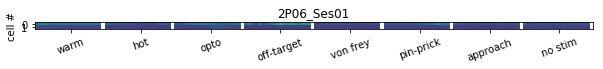

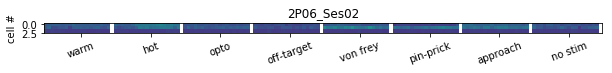

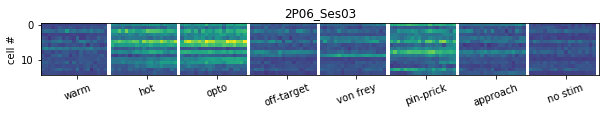

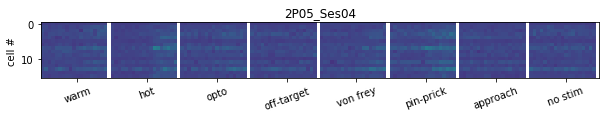

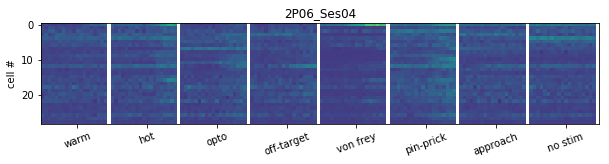

...

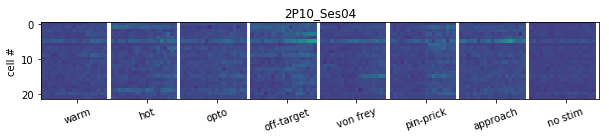

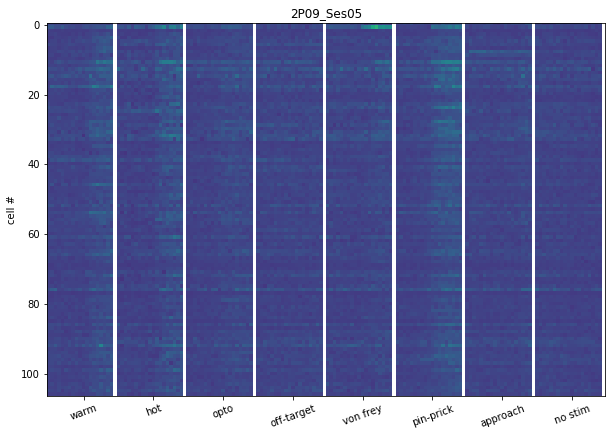

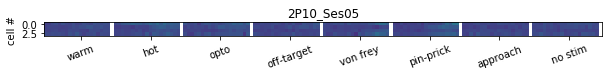

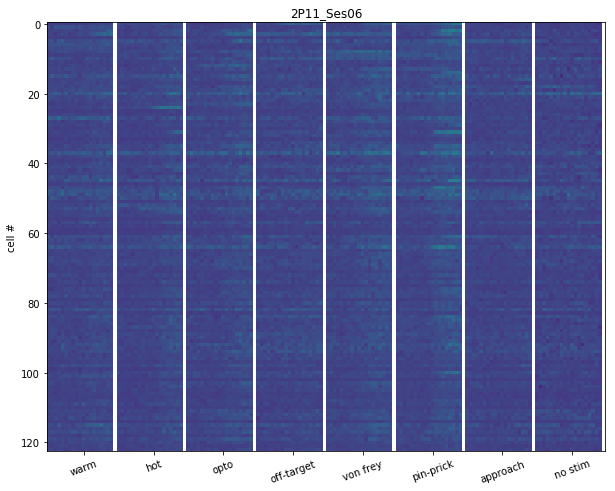

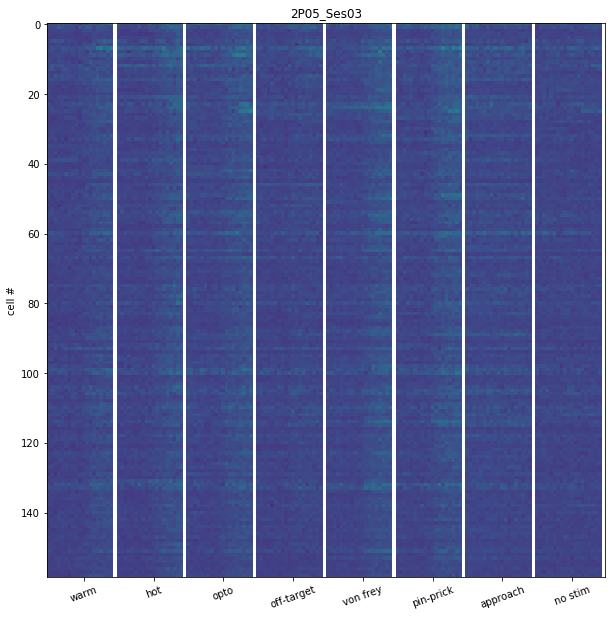

In [35]:
for session in sessions:
    if session.startswith('._'): # circumventing issues with invisible files on external drives
        continue
    if session.endswith('2P05_Ses01.csv'): # excluding for the time being incomplete sessions (half-sessions)
        continue
    if session.endswith('2P05_Ses02.csv'):
        continue
    if session.endswith('2P07_Ses02.csv'):
        continue
    if session.endswith('2P11_Ses03.csv'):
        continue
    if session.endswith('2P08_Ses03.csv'): # this one doesn't have 'opto' or 'approach'
        continue
    if session.endswith('CFA.csv'): # excluding for the time being CFA sessions
        continue
    
    print('processing: ', session)
    
    session_name = session[12:22]
    print(session_name)
    
    session_pearsons = pearsons[pearsons['cell_id'].str.contains(str(session_name))]
    motion = session_pearsons[session_pearsons['pearsons'] >= 0.20]
    motion_ids = list(motion['cell_id'])
    
    cells = pd.read_csv(os.path.join(input_path,session), index_col=0)
    still_cells = cells.drop(columns=motion_ids)
    motion_cells = cells[motion_ids]
    motion_cells['identifier'] = cells['identifier']
    still_ids = list(still_cells.columns)
    
    mean_matrix = pd.DataFrame()
    max_matrix = pd.DataFrame()
    
    for s in stimuli:
        cols = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19]
        trial_means = []
        trial_maxis = []
        stimulation = motion_cells[motion_cells['identifier'].str.contains(str((s)))]
        stimulation = stimulation.reset_index(drop=True)
        trials = stimulation['identifier'].unique()
        
        for mid in motion_ids:
            repli_traces = pd.DataFrame()
            
            for t in trials:
                trace_idx = stimulation[stimulation['identifier'].str.contains(str(t))].index.tolist()
                trace = stimulation[mid]
                temp_trace = trace.loc[trace_idx[0]:trace_idx[-1]]
                temp_trace = temp_trace.reset_index(drop=True)
                repli_traces[t] = temp_trace
                #smooth_trace = temp_trace.rolling(2, center=True).mean()
                #plt.plot(smooth_trace, alpha=0.5)
                #plt.axvline(x=10, color='red', lw=1)
                #plt.ylim([-0.02,0.1])
                #plt.title(s+'_'+sid)
            #plt.plot(repli_traces.mean(axis=1), color='black', alpha=0.5)
            #plt.show()
            
            trial_means.append(repli_traces.mean(axis=1))
            trial_maxis.append(repli_traces.max(axis=0).mean())
            
        df = pd.DataFrame(trial_means, columns=cols)
        #df['cell'] = still_ids[:-1]
        #df['stimulus'] = s
        mean_matrix = pd.concat([mean_matrix, df], axis=1)
        
        #df1 = pd.DataFrame(trial_maxis)
        #df1['cell'] = still_ids[:-1]
        #df1['stimulus'] = s
        #max_matrix = pd.concat([max_matrix, df1], axis=0)
        

    #mean_matrix['cell'] = mean_matrix['cell']+'_'+mean_matrix['stimulus']
    #mean_matrix = mean_matrix.drop(columns='stimulus')   
    #mean_matrix = mean_matrix.set_index('cell') 
    #mean_matrix.to_csv(os.path.join(output_path, session_name+'_mean_matrix.csv'))
    
    #corr = mean_matrix.T.corr().values
    #plt.figure(figsize = (10,10))
    #plt.imshow(corr)
    #plt.title(session_name+': trial means correlation matrix')
    #plt.savefig(os.path.join(output_path, session_name +'_trial_mean_corr_3sec.png'))
    #plt.show()
    
    #plt.figure(figsize=(10, 7))
    #plt.title(session_name+': trial means hierarchical clusering')
    #dend = shc.dendrogram(shc.linkage(mean_matrix, method='ward'))
    #plt.savefig(os.path.join(output_path, session_name +'_trial_mean_clust_3sec.png'))
    #plt.show()

     #max_matrix['cell'] = max_matrix['cell']+'_'+max_matrix['stimulus']
     #max_matrix = max_matrix.drop(columns='stimulus')   
     #max_matrix = max_matrix.set_index('cell') 
     #max_matrix.to_csv(os.path.join(output_path, session_name+'_max_matrix.csv'))
    
    plt.figure(figsize=(10,20))
    plt.imshow(mean_matrix, vmin=-0.02, vmax=0.1)
    #plt.colorbar()
    plt.title(session_name)
    plt.xticks([10,30,50,70,90,110,130,150], stimuli, rotation=20)
    plt.ylabel('cell #')
    plt.savefig(os.path.join(output_path, session_name +'_heatmap_3sec_motioncell.png'))
    #plt.show()

In [32]:
ids = cells['identifier']
motion_cells['identifier'] = ids
motion_cells.head()

/Users/aspra/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,2P06_Ses01_87,2P06_Ses01_118,identifier
386,0.031412,0.003308,2P06_Ses01_26OCT2021_pin-prick_Trial_1_57352
387,0.005453,0.002474,2P06_Ses01_26OCT2021_pin-prick_Trial_1_57352
388,0.000987,0.001931,2P06_Ses01_26OCT2021_pin-prick_Trial_1_57352
389,0.023574,0.005098,2P06_Ses01_26OCT2021_pin-prick_Trial_1_57352
390,0.021836,0.001746,2P06_Ses01_26OCT2021_pin-prick_Trial_1_57352


In [24]:
motion_cells.tail()

,2P06_Ses02_72,2P06_Ses02_80,2P06_Ses02_884,identifier
18474,0.011837,0.013221,0.001783,2P06_Ses02_28OCT2021_no stim_Trial_3_76661
18475,0.007200,0.013467,0.002257,2P06_Ses02_28OCT2021_no stim_Trial_3_76661
18476,0.005923,0.018065,0.003886,2P06_Ses02_28OCT2021_no stim_Trial_3_76661
18477,0.015049,0.019828,0.000621,2P06_Ses02_28OCT2021_no stim_Trial_3_76661
18478,0.006317,0.021456,0.001816,2P06_Ses02_28OCT2021_no stim_Trial_3_76661


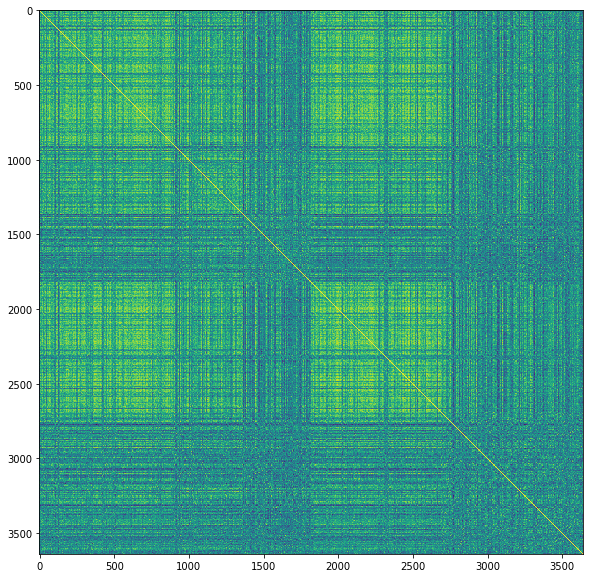

In [12]:
corr = mean_matrix.T.corr().values
plt.figure(figsize = (10,10))
plt.imshow(corr)
plt.show()



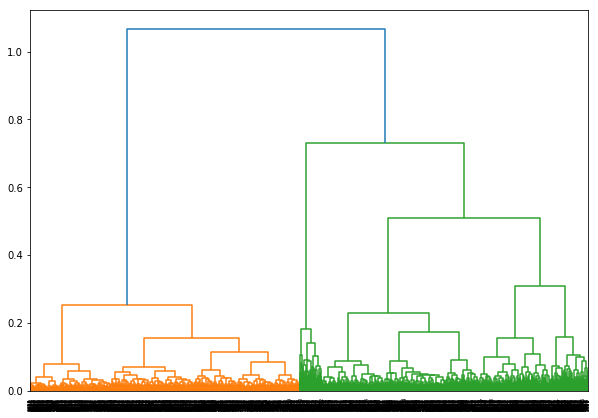

In [13]:
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(10, 7))
#plt.title("Mouse 7 Awake Dendograms")
dend = shc.dendrogram(shc.linkage(mean_matrix, method='ward'))
plt.show()
#plt.savefig(path+"/'shc_m7_awake_wardmethod)'.png", dpi=300) 




In [14]:
from sklearn.cluster import AgglomerativeClustering

cluster = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')
cfit = cluster.fit_predict(mean_matrix)

pd.DataFrame(cfit).to_csv(output_path+session_name+"_cfit.csv")

/Users/aspra/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/least_angle.py:35: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  eps=np.finfo(np.float).eps,
/Users/aspra/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/least_angle.py:597: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  eps=np.finfo(np.float).eps, copy_X=Tr

In [18]:
max_matrix = max_matrix.drop(columns='max')
max_matrix.head()

,0
cell,
2P05_Ses03_0_warm,0.041174
2P05_Ses03_1_warm,0.026344
2P05_Ses03_5_warm,0.015811
2P05_Ses03_6_warm,0.016236
2P05_Ses03_7_warm,0.017864
